# Running through all data preprocessing 

The purpose of this notebook is to run through all data preprocessing to be a 100% sure what data we are using when we are using. 

In [394]:
import numpy as np
import pandas as pd
import datetime as dt
import time
import matplotlib.pyplot as plt
from geopy import distance
from sklearn.cluster import DBSCAN
import time
import re
import folium
from matplotlib.ticker import MaxNLocator
from tqdm import tqdm

In [2]:
import warnings
warnings.filterwarnings('ignore')

## IMPORT DATA

In [3]:
df = pd.read_csv('C:\\Users\\User\\OneDrive - Danmarks Tekniske Universitet\\SAS_030919\\6. Semester\\BSc\\Bachelor2021\\data\\ChargePoint Data CY20Q4.csv', low_memory = False)

In [4]:
df

,Station Name,MAC Address,Org Name,Start Date,Start Time Zone,End Date,End Time Zone,Transaction Date (Pacific Time),Total Duration (hh:mm:ss),Charging Time (hh:mm:ss),...,Longitude,Currency,Fee,Ended By,Plug In Event Id,Driver Postal Code,User ID,County,System S/N,Model Number
0,PALO ALTO CA / HAMILTON #1,000D:6F00:015A:9D76,City of Palo Alto,7/29/2011 20:17,PDT,7/29/2011 23:20,PDT,7/29/2011 23:20,3:03:32,1:54:03,...,-122.160309,USD,0.00,Plug Out at Vehicle,3,95124.0,3284,NaN,NaN,NaN
1,PALO ALTO CA / HAMILTON #1,000D:6F00:015A:9D76,City of Palo Alto,7/30/2011 0:00,PDT,7/30/2011 0:02,PDT,7/30/2011 0:02,0:02:06,0:01:54,...,-122.160309,USD,0.00,Customer,4,94301.0,4169,NaN,NaN,NaN
2,PALO ALTO CA / HAMILTON #1,000D:6F00:015A:9D76,City of Palo Alto,7/30/2011 8:16,PDT,7/30/2011 12:34,PDT,7/30/2011 12:34,4:17:32,4:17:28,...,-122.160309,USD,0.00,Plug Out at Vehicle,5,94301.0,4169,NaN,NaN,NaN
3,PALO ALTO CA / HAMILTON #1,000D:6F00:015A:9D76,City of Palo Alto,7/30/2011 14:51,PDT,7/30/2011 16:55,PDT,7/30/2011 16:55,2:03:24,2:02:58,...,-122.160309,USD,0.00,Customer,6,94302.0,2545,NaN,NaN,NaN
4,PALO ALTO CA / HAMILTON #1,000D:6F00:015A:9D76,City of Palo Alto,7/30/2011 18:51,PDT,7/30/2011 20:03,PDT,7/30/2011 20:03,1:11:24,0:43:54,...,-122.160309,USD,0.00,Plug Out at Vehicle,7,94043.0,3765,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259410,PALO ALTO CA / TED THOMPSON #3,0024:B100:0002:9F81,City of Palo Alto,12/31/2020 16:39,PST,12/31/2020 17:14,PST,12/31/2020 17:16,0:35:44,0:35:18,...,-122.144043,USD,0.42,Plug Out at Vehicle,2369,94301.0,2024201,NaN,1.745410e+11,CT4020-HD-GW
259411,PALO ALTO CA / WEBSTER #1,0024:B100:0002:4233,City of Palo Alto,12/31/2020 16:48,PST,12/31/2020 20:31,PST,12/31/2020 20:32,3:43:01,2:14:04,...,-122.158272,USD,4.69,Plug Out at Vehicle,7255,94541.0,242661,Santa Clara County,1.336410e+11,CT4020-HD-GW
259412,PALO ALTO CA / MPL #4,0024:B100:0003:CD37,City of Palo Alto,12/31/2020 17:28,PST,1/1/2021 10:56,PST,1/1/2021 10:57,17:28:14,5:08:12,...,-122.113510,USD,6.82,Plug Out at Vehicle,455,94306.0,449995,Santa Clara County,2.002410e+11,CT4010-HD-GW
259413,PALO ALTO CA / WEBSTER #1,0024:B100:0002:4233,City of Palo Alto,12/31/2020 17:49,PST,12/31/2020 21:55,PST,12/31/2020 21:56,4:05:34,3:53:42,...,-122.158272,USD,2.75,Plug Out at Vehicle,7256,94552.0,804075,Santa Clara County,1.336410e+11,CT4020-HD-GW


# Separate functions 

### Time

In [5]:
def timedelta_duration(time): #There's 22 instances where Total Duration > 24hrs -> we cant use datetime as originally done
    time1 = time.replace(':0', ':')
    h = time1.split(':')[0]
    m = time1.split(':')[1]
    s = time1.split(':')[2]
    
    td = dt.timedelta(hours = int(h), minutes = int(m), seconds = int(s))
    
    return td

In [6]:
def time_converter(df): #Creates datetimes in relevant columns 
    df["Start Date"]=pd.to_datetime(df["Start Date"],format="%m/%d/%Y %H:%M", errors="coerce")
    df["End Date"]=pd.to_datetime(df["End Date"],format="%m/%d/%Y %H:%M", errors="coerce")
    df['Transaction Date (Pacific Time)']=pd.to_datetime(df['Transaction Date (Pacific Time)'],format="%m/%d/%Y %H:%M", errors="coerce")
    
    df["Total Duration (hh:mm:ss)"] = df["Total Duration (hh:mm:ss)"].apply(timedelta_duration)
    df["Charging Time (hh:mm:ss)"] = df["Charging Time (hh:mm:ss)"].apply(timedelta_duration)
    
    df["End Date"][df["End Date"].isna()] = df['Start Date'][df["End Date"].isna()] + df["Total Duration (hh:mm:ss)"][df["End Date"].isna()] #There's 40 instances of this
    
    #df["Total Duration (hh:mm:ss)"]=pd.to_datetime(df["Total Duration (hh:mm:ss)"],format="%H:%M:%S", errors="coerce") # - dt.datetime(1900, 1, 1))
    #df["Charging Time (hh:mm:ss)"]=pd.to_datetime(df["Charging Time (hh:mm:ss)"],format="%H:%M:%S", errors="coerce") #- dt.datetime(1900, 1, 1))
    
    return df

In [7]:
def fix_UTC(df): #Fixes instances whith timezone UTC
    #df['Start Date'][(df['Start Time Zone'] == 'UTC') | (df['End Time Zone'] == 'UTC')] = df['Transaction Date (Pacific Time)'] - (df['Total Duration (hh:mm:ss)'] - dt.datetime(1900, 1, 1)).round('1min')
    df['Start Date'][(df['Start Time Zone'] == 'UTC') | (df['End Time Zone'] == 'UTC')] = df['Transaction Date (Pacific Time)'] - df['Total Duration (hh:mm:ss)']
    
    
    df['End Date'][(df['Start Time Zone'] == 'UTC') | (df['End Time Zone'] == 'UTC')] = df['Transaction Date (Pacific Time)']
    #df['Transaction Date (Pacific Time)'][(df['Start Time Zone'] == 'UTC') | (df['End Time Zone'] == 'UTC')].isnull().sum()
    #There are instances where 'Transaction Date (Pacific Time)' is a NaN but luckily none that will affect the above function 
    return df

In [8]:
def duration_times_to_float(df): #Turns duration times into minutes (floats)
    df["Charging Time (hh:mm:ss)"] = df["Charging Time (hh:mm:ss)"].apply(lambda td: td.total_seconds() / 60)
    df["Total Duration (hh:mm:ss)"]=df["Total Duration (hh:mm:ss)"].apply(lambda td: td.total_seconds() / 60)
    df = df.rename(columns={'Charging Time (hh:mm:ss)': 'Charging Time (mins)', 'Total Duration (hh:mm:ss)': 'Total Duration (mins)'})
    
    
    #df["Charging Time (hh:mm:ss)"] = df["Charging Time (hh:mm:ss)"].total_seconds() / 60
    #df["Total Duration (hh:mm:ss)"]=df["Total Duration (hh:mm:ss)"].total_seconds() / 60
    
    #df["Charging Time (hh:mm:ss)"]=df["Charging Time (hh:mm:ss)"].dt.hour *60 + df["Charging Time (hh:mm:ss)"].dt.minute + df["Charging Time (hh:mm:ss)"].dt.second/60
    #df["Total Duration (hh:mm:ss)"]=df["Total Duration (hh:mm:ss)"].dt.hour *60 + df["Total Duration (hh:mm:ss)"].dt.minute + df["Total Duration (hh:mm:ss)"].dt.second/60
    return df

### Currency

In [9]:
def currency_converter(df):
    #print(df['Currency'].unique())
    #print(df[(df['Currency'] == 'EUR') & df['Fee'] != 0])
    #print(df[(df['Currency'] == 'MXN') & df['Fee'] != 0])
    #print(df[(df['Currency'] == 'CAD') & df['Fee'] != 0])
    df['Fee'][(df['Currency'] == 'EUR') & df['Fee'] != 0] = df['Fee'][(df['Currency'] == 'EUR') & df['Fee'] != 0] * ((1.18 + 1.18)/2)
    df['Fee'][(df['Currency'] == 'MXN') & df['Fee'] != 0] = df['Fee'][(df['Currency'] == 'MXN') & df['Fee'] != 0] * ((0.06 + 0.06)/2)
    #There are very few instances where there is a fee and the currency is not USD - actually just 4 
    #(and to be honest they might actually also be in USD, that would make better sence for the MXN cost but we'll trust them in this case)
    #Since the occurences lies really close in time these 2x2 are accounted for by taking a mean of the exchange rates (they're actually the same) for the given days
    #Exchange rates are found at https://fxtop.com/en/historical-currency-converter.php?A=1&C1=MXN&C2=USD&DD=08&MM=08&YYYY=2014&B=1&P=&I=1&btnOK=Go%21
    df = df.rename(columns = {'Fee': 'Fee (USD)'}) #Just so we know they've been converted 

    return df 

### Correcting MAC Address

In [10]:
def correcting_MAC(df): 
    df['MAC Address'] = df['MAC Address'].str.replace(":", "")
    return df 

### Drop data 

In [11]:
def data_drop(df): #Actually rather what to *keep*
    df = df[['Station Name', 'MAC Address', 'Start Date', 'End Date', 'Total Duration (mins)', 'Charging Time (mins)', 
             'Energy (kWh)', 'Port Number', 'Plug Type', 'Latitude', 'Longitude', 'Fee (USD)']]
    return df

In [12]:
def no_2020(df): 
    df_no2020 = df[(df['Start Date'].dt.year < 2020) & (df['End Date'].dt.year < 2020)]
    return df_no2020

In [13]:
df = time_converter(df)
df = fix_UTC(df)
df = duration_times_to_float(df)
df = currency_converter(df)
df = correcting_MAC(df)
df = data_drop(df)
df = no_2020(df)

### Grouping MAC Addresses and assigning labels 

In [14]:
#Is there a mac that changes name?
#NB this has to be run after cleaning the MACS 

macs = list(df['MAC Address'].unique())
for mac in macs: 
    names = df[df['MAC Address'] == mac]['Station Name'].unique()
    if len(names) > 1: 
        print(mac)
        print(names)

000D6F00009ED39E
['PALO ALTO CA / HAMILTON #2' 'PALO ALTO CA / BRYANT #3']


So that one actually changes name.... 

In [15]:
df[df['MAC Address'] == '000D6F00009ED39E'][['Station Name','Latitude', 'Longitude']].drop_duplicates()

,Station Name,Latitude,Longitude
10,PALO ALTO CA / HAMILTON #2,37.444607,-122.160263
53956,PALO ALTO CA / BRYANT #3,37.446583,-122.162109


And location.... 
Let's call the latter '000D6F00009ED39Exxx' so that it actually is two stations... 

In [16]:
print(df[(df['MAC Address'] == '000D6F00009ED39E') & (df['Station Name'] == 'PALO ALTO CA / HAMILTON #2')]['Start Date'].min())
print(df[(df['MAC Address'] == '000D6F00009ED39E') & (df['Station Name'] == 'PALO ALTO CA / BRYANT #3')]['Start Date'].min())

2011-08-02 12:26:00
2016-01-14 11:57:00


So BRYANT is the latter. 

In [17]:
df['MAC Address'][df['Station Name'] =='PALO ALTO CA / BRYANT #3'] = '000D6F00009ED39E_BRYANT'

In [18]:
def label_generator(df):
    df['Label'] = 'x'
    snames = df['Station Name'].unique()
    s2 = set()
    for s in snames:
        s = s.replace('PALO ALTO CA / ', '')
        s = s.replace('#', '')
        s = re.sub(r'\d+', '',s)
        s = s.replace('T  ', 'T ')
        
        s2.add(s)
    s2 = list(s2)
    print(s2)
    for cluster, string in enumerate(s2):
        print(cluster)
        print(string)
        df['Label'][df['Station Name'].str.contains(string)] = cluster
        #print(df['Label'][df['Station Name'].str.contains(s2[i])])
        print(f"Observations: {len(df['Label'][df['Station Name'].str.contains(string)])}")
    #df = df.drop(columns = ['Station Name'])
    
    nr_labels = len(df['Label'].unique())
    
    df["CenterLat"] = 'x'
    df["CenterLon"] = 'x'
    
    for i in range(nr_labels):
        df["CenterLat"][df["Label"]==i] = df["Latitude"][df["Label"]==i].mean()
        df["CenterLon"][df["Label"]==i]=df["Longitude"][df["Label"]==i].mean()
    
    return df
    

In [19]:
#def label_generator(df):
#    lat = list(df.drop_duplicates(['Latitude','Longitude'])['Latitude'])
#    lon = list(df.drop_duplicates(['Latitude','Longitude'])['Longitude'])
#    loc= []
#    for i in range(len(lat)):
#        loc.append([lat[i],lon[i]])
#    
#    dbscan = DBSCAN(eps=0.002,min_samples=1).fit(loc)
#    labels = pd.DataFrame([lat,lon,dbscan.labels_]).T
#    labels.columns=["Latitude","Longitude","Label"]
#    labels["Label"]=labels["Label"].astype(int)
#    df_withLabels = df.merge(labels, on=["Latitude","Longitude"])
#    
#    nr_labels = len(df_withLabels['Label'].unique())
#    
#    df_withLabels['CenterLat'] = 0
#    df_withLabels['CenterLon'] = 0
#    
#    for i in range(nr_labels + 1):
#        df_withLabels["CenterLat"][df_withLabels["Label"]==i]=df_withLabels["Latitude"][df_withLabels["Label"]==i].mean()
#        df_withLabels["CenterLon"][df_withLabels["Label"]==i]=df_withLabels["Longitude"][df_withLabels["Label"]==i].mean()
#        
#    return df_withLabels

In [20]:
#df = time_converter(df)
#df = fix_UTC(df)
#df = duration_times_to_float(df)
#df = currency_converter(df)
#df = correcting_MAC(df)
#df = data_drop(df)
#df = no_2020(df)
df = label_generator(df)


['HAMILTON ', 'MPL ', 'RINCONADA LIB ', 'BRYANT ', 'WEBSTER ', 'HIGH ', 'CAMBRIDGE ', 'TED THOMPSON ']
0
HAMILTON 
Observations: 36573
1
MPL 
Observations: 26362
2
RINCONADA LIB 
Observations: 17560
3
BRYANT 
Observations: 44631
4
WEBSTER 
Observations: 34938
5
HIGH 
Observations: 36853
6
CAMBRIDGE 
Observations: 27940
7
TED THOMPSON 
Observations: 14458


In [21]:
df.head()

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.050000,6.249457,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
1,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 00:00:00,2011-07-30 00:02:00,2.100000,1.900000,0.106588,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
2,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 08:16:00,2011-07-30 12:34:00,257.533333,257.466667,14.951777,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
3,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 14:51:00,2011-07-30 16:55:00,123.400000,122.966667,7.159643,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
4,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 18:51:00,2011-07-30 20:03:00,71.400000,43.900000,1.957765,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16


In [22]:
df.tail()

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon
239311,PALO ALTO CA / BRYANT #3,000D6F00009ED39E_BRYANT,2019-12-31 18:36:00,2019-12-31 19:34:00,57.933333,57.750000,5.674,2,J1772,37.446583,-122.162109,1.31,3,37.4466,-122.162
239312,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2019-12-31 18:56:00,2019-12-31 20:32:00,96.333333,96.000000,8.926,2,J1772,37.444489,-122.160370,2.05,0,37.4445,-122.16
239314,PALO ALTO CA / TED THOMPSON #3,0024B10000029F81,2019-12-31 19:43:00,2019-12-31 20:57:00,74.250000,73.900000,6.160,1,J1772,37.428623,-122.144043,1.42,7,37.4284,-122.144
239315,PALO ALTO CA / HIGH #3,0024B10000025939,2019-12-31 20:01:00,2019-12-31 21:12:00,71.133333,70.866667,7.046,1,J1772,37.443443,-122.163139,1.62,5,37.4434,-122.163
239317,PALO ALTO CA / WEBSTER #1,0024B10000024233,2019-12-31 21:33:00,2019-12-31 21:41:00,8.083333,5.400000,0.186,1,J1772,37.448284,-122.158272,0.04,4,37.4484,-122.158


In [23]:
df.to_csv('df_28042021.csv')

In [24]:
df[['Station Name', 'Label']].drop_duplicates().sort_values('Label')

,Station Name,Label
0,PALO ALTO CA / HAMILTON #1,0
10,PALO ALTO CA / HAMILTON #2,0
26508,PALO ALTO CA / MPL #3,1
26243,PALO ALTO CA / MPL #5,1
26088,PALO ALTO CA / MPL #2,1
26087,PALO ALTO CA / MPL #6,1
26219,PALO ALTO CA / MPL #1,1
26085,PALO ALTO CA / MPL #4,1
29733,PALO ALTO CA / RINCONADA LIB 2,2
29735,PALO ALTO CA / RINCONADA LIB 1,2


In [25]:
#Where's label 3???  SHERMAN (Label 3) is introduced in 2020! 

In [26]:
m = folium.Map(location=[37.435, -122.16], tiles="Stamen Toner", zoom_start=13)

In [27]:
#colors = ['red','blue','gray','orange','black','green','purple', 'yellow', 'cyan']
#colors = ['red', 'orange', 'yellow', 'green', 'cyan', 'blue', 'purple', 'black']
colors = ['red', 'orange', 'gray', 'green', 'darkgreen', 'blue', 'purple', 'black']


#cols = dict(zip(groups,colors))

macs = df['MAC Address'].unique()
for mac in macs: 
    maclat = df[df['MAC Address'] == mac]['Latitude'].min()
    maclon = df[df['MAC Address'] == mac]['Longitude'].min()
    maclabel = df[df['MAC Address'] == mac]['Label'].min()
    macstationname = df[df['MAC Address'] == mac]['Station Name'].min()
    #folium.Circle(radius = 25, fill = True, fill_opacity=0.7,
    #              location = [maclat, maclon],
    #              color = colors[maclabel]).add_to(m)
    
    folium.Marker(icon=folium.Icon(color=colors[maclabel], icon='plug', prefix='fa'),
                  location = [maclat, maclon], popup= f"Station Name: {macstationname}\nLabel: {maclabel}"
                  ).add_to(m)

labels = df['Label'].unique()
for label in labels: 
    centerlat = df[df['Label'] == label]['CenterLat'].min()
    centerlon = df[df['Label'] == label]['CenterLon'].min()
    
    folium.Circle(radius = 5, fill = True, fill_opacity=1,
                  location = [centerlat, centerlon],
                  color = colors[label]).add_to(m)
    

In [28]:
m

In [76]:
df.isna().sum()

Station Name             0
MAC Address              0
Start Date               0
End Date                 0
Total Duration (mins)    0
Charging Time (mins)     0
Energy (kWh)             0
Port Number              0
Plug Type                0
Latitude                 0
Longitude                0
Fee (USD)                0
Label                    0
CenterLat                0
CenterLon                0
dtype: int64

### Censoring
The manual censoring should be carried out before down sampling. 

**NB! THIS IS PROBABLY NOT THE BEST WAY TO DO IT - SHOULDNT BE FOR EACH MAC BUT FOR EACH STATION**

In [829]:
def availability(df):

    macs = df['MAC Address'].unique()
    dfnew = pd.DataFrame()
    for mac in macs: 
        dftemp = df[df['MAC Address'] == mac]
        dftemp = dftemp.sort_values(by=['Start Date'])
        dftemp['All taken'] = 0
        dftemp['Plugs'] = 'x'
        dftemp['None available (mins)'] = 0
        
        nr_ports = max(dftemp['Port Number'].unique())
        dftemp['Plugs'] = nr_ports
        
        if nr_ports == 1:
            dftemp['All taken'] = 1
            dftemp['None available (mins)'] = dftemp['Total Duration (mins)']
        
        elif nr_ports == 2: 
            dftemp['All taken'][dftemp['Start Date'] < dftemp['End Date'].shift()] = 1
            dftemp['None available (mins)'][(dftemp['Start Date'] - dftemp['End Date'].shift()) < dt.timedelta(0)] = abs(dftemp['Start Date'] - dftemp['End Date'].shift())
            
        dfnew = dfnew.append(dftemp)
    return dfnew

In [830]:
aa = availability(df)
aa.head()

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,All taken,Plugs,None available (mins)
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.050000,6.249457,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
1,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 00:00:00,2011-07-30 00:02:00,2.100000,1.900000,0.106588,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
2,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 08:16:00,2011-07-30 12:34:00,257.533333,257.466667,14.951777,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
3,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 14:51:00,2011-07-30 16:55:00,123.400000,122.966667,7.159643,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
4,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 18:51:00,2011-07-30 20:03:00,71.400000,43.900000,1.957765,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00


In [832]:
aa[(aa['All taken'] == 1) & (aa['Plugs'] == 2)]

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,All taken,Plugs,None available (mins)
71,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-16 19:24:00,2011-08-16 22:56:00,212.050000,211.933333,4.495111,1,NEMA 5-20R,37.444572,-122.160309,0.00,5,1,2,0 days 00:26:00
80,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-18 18:14:00,2011-08-18 18:28:00,14.400000,6.000000,0.122652,1,NEMA 5-20R,37.444572,-122.160309,0.00,5,1,2,0 days 00:34:00
623,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-11-01 12:18:00,2011-11-01 15:23:00,185.583333,184.933333,3.926095,1,NEMA 5-20R,37.444572,-122.160309,0.00,5,1,2,0 days 00:23:00
645,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-11-03 11:02:00,2011-11-03 12:37:00,94.916667,41.583333,0.884716,1,NEMA 5-20R,37.444572,-122.160309,0.00,5,1,2,0 days 00:27:00
693,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-11-07 14:41:00,2011-11-07 15:02:00,20.783333,19.733333,0.406982,1,NEMA 5-20R,37.444572,-122.160309,0.00,5,1,2,0 days 01:20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237866,PALO ALTO CA / TED THOMPSON #2,0024B10000025B77,2019-12-17 14:14:00,2019-12-17 15:21:00,66.900000,66.750000,6.666000,2,J1772,37.428570,-122.143929,1.53,6,1,2,0 days 03:16:00
238016,PALO ALTO CA / TED THOMPSON #2,0024B10000025B77,2019-12-18 13:04:00,2019-12-18 14:57:00,113.116667,112.716667,5.975000,2,J1772,37.428570,-122.143929,1.37,6,1,2,0 days 03:00:00
238155,PALO ALTO CA / TED THOMPSON #2,0024B10000025B77,2019-12-19 11:14:00,2019-12-19 15:13:00,238.450000,237.533333,23.506000,2,J1772,37.428570,-122.143929,5.41,6,1,2,0 days 01:06:00
238173,PALO ALTO CA / TED THOMPSON #2,0024B10000025B77,2019-12-19 12:22:00,2019-12-19 13:12:00,50.716667,50.583333,5.122000,1,J1772,37.428570,-122.143929,1.18,6,1,2,0 days 02:51:00


In [833]:
aa.loc[70:80]

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,All taken,Plugs,None available (mins)
70,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-16 18:26:00,2011-08-16 19:50:00,84.316667,36.566667,1.596976,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
71,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-16 19:24:00,2011-08-16 22:56:00,212.050000,211.933333,4.495111,1,NEMA 5-20R,37.444572,-122.160309,0.0,5,1,2,0 days 00:26:00
74,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-17 20:31:00,2011-08-17 23:30:00,179.266667,178.966667,10.459173,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
76,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-18 08:35:00,2011-08-18 11:05:00,150.600000,118.866667,6.363991,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
77,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-18 11:59:00,2011-08-18 13:42:00,144.383333,102.883333,5.014686,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
79,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-18 17:22:00,2011-08-18 18:48:00,86.616667,52.050000,2.313549,2,J1772,37.444572,-122.160309,0.0,5,0,2,0 days 00:00:00
80,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-08-18 18:14:00,2011-08-18 18:28:00,14.400000,6.000000,0.122652,1,NEMA 5-20R,37.444572,-122.160309,0.0,5,1,2,0 days 00:34:00


In [192]:
df.head()

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.050000,6.249457,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
1,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 00:00:00,2011-07-30 00:02:00,2.100000,1.900000,0.106588,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
2,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 08:16:00,2011-07-30 12:34:00,257.533333,257.466667,14.951777,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
3,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 14:51:00,2011-07-30 16:55:00,123.400000,122.966667,7.159643,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16
4,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 18:51:00,2011-07-30 20:03:00,71.400000,43.900000,1.957765,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16


### Active plugs

In [565]:
test = df.copy()
test = test[test['Label'] == 0]
test.shape

(36573, 15)

In [566]:
#pd.date_range(start=test['Start Date'].min(), end=test['End Date'].max(), freq='Min')

In [567]:
test = test.head(500)

In [568]:
start_time = time.time()
dfsim = pd.DataFrame()

for index, row in tqdm(test.iterrows(), total=test.shape[0]):


#for index, row in test.iterrows():
    df_onecharge = pd.DataFrame(index = pd.date_range(start=row['Start Date'], end=row['End Date'], freq='Min'))
    
    dfsim = pd.concat([dfsim, df_onecharge])
print("This bastard took", (time.time() - start_time)/60, "minutes to run...")

100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 567.38it/s]

This bastard took 0.014773325125376383 minutes to run...


In [569]:
dfsim

""
2011-07-29 20:17:00
2011-07-29 20:18:00
2011-07-29 20:19:00
2011-07-29 20:20:00
2011-07-29 20:21:00
...
2011-11-03 20:14:00
2011-11-03 20:15:00
2011-11-03 20:16:00
2011-11-03 20:17:00


In [570]:
dfsim2 = dfsim[~dfsim.index.duplicated(keep='first')]

In [571]:
dfsim2

""
2011-07-29 20:17:00
2011-07-29 20:18:00
2011-07-29 20:19:00
2011-07-29 20:20:00
2011-07-29 20:21:00
...
2011-11-03 20:14:00
2011-11-03 20:15:00
2011-11-03 20:16:00
2011-11-03 20:17:00


In [540]:
#Works but slow
start_time = time.time()

for index, row in tqdm(test.iterrows(), total=test.shape[0]):
    one = pd.DataFrame(index = pd.date_range(start=row['Start Date'], end=row['End Date'], freq='Min'))
    one[index] = 1
    dfsim2 = dfsim2.merge(one, how = 'left', left_index = True, right_index = True)
    
    #s = row['Start Date']
    #e = row['End Date']
    #dfsim2[f'Charge {index}'] = 0
    #dfsim2[f'Charge {index}'].loc[s:e] = 1
print("This bastard took", (time.time() - start_time)/60, "minutes to run...")

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:14<00:00,  6.73it/s]

This bastard took 1.239187228679657 minutes to run...


In [542]:
import numba

In [556]:
start_time = time.time()
for index, row in tqdm(test.iterrows(), total=test.shape[0]):
    one = pd.DataFrame(index = pd.date_range(start=row['Start Date'], end=row['End Date'], freq='Min'))
    one[index] = 1
    dfsim2 = dfsim2.merge(one, how = 'left', left_index = True, right_index = True)
    
    #s = row['Start Date']
    #e = row['End Date']
    #dfsim2[f'Charge {index}'] = 0
    #dfsim2[f'Charge {index}'].loc[s:e] = 1
print("This bastard took", (time.time() - start_time)/60, "minutes to run...")

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.49it/s]

This bastard took 0.7947254737218221 minutes to run...


In [585]:
def active_minutes(start, end, index):
    #one = pd.DataFrame(index = pd.date_range(start=row['Start Date'], end=row['End Date'], freq='Min'))
    #one[index] = 1
    #dfsim2 = dfsim2.merge(one, how = 'left', left_index = True, right_index = True)
    #junk = 2
    #print(start)
    #print(end)
    return end - start


#def days_prev_holiday(date, holidays):
#    difference=[]
#    for item in holidays:
#        difference.append(int(str((item-date).days)))
#    return abs(max([x for x in difference if x<=0]))
##df.apply(lambda row: days_prev_holiday(row['Date'], holidays), axis=1)

In [586]:
test.head(1)

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.05,6.249457,2,J1772,37.444572,-122.160309,0.0,0,37.4445,-122.16


In [587]:
active_minutes(test['Start Date'][1], test['End Date'][1], test.index[1]) 

Timedelta('0 days 00:02:00')

In [593]:
test.apply(active_minutes(test['Start Date'], test['End Date'], row.index))

ValueError: no results

In [463]:
ryt = pd.DataFrame(index = pd.date_range(start=test['Start Date'][0], end=test['End Date'][0], freq='Min'))
ryt[0] = 1
ryt

,0
2011-07-29 20:17:00,1
2011-07-29 20:18:00,1
2011-07-29 20:19:00,1
2011-07-29 20:20:00,1
2011-07-29 20:21:00,1
...,...
2011-07-29 23:16:00,1
2011-07-29 23:17:00,1
2011-07-29 23:18:00,1
2011-07-29 23:19:00,1


In [468]:
dfsim.merge(ryt, how = 'left', left_index = True, right_index = True)

,0
2011-07-29 20:17:00,1.0
2011-07-29 20:18:00,1.0
2011-07-29 20:19:00,1.0
2011-07-29 20:20:00,1.0
2011-07-29 20:21:00,1.0
...,...
2019-12-31 20:28:00,NaN
2019-12-31 20:29:00,NaN
2019-12-31 20:30:00,NaN
2019-12-31 20:31:00,NaN


In [477]:
dfsim2['Active plugs'] = dfsim2.sum(axis = 1)

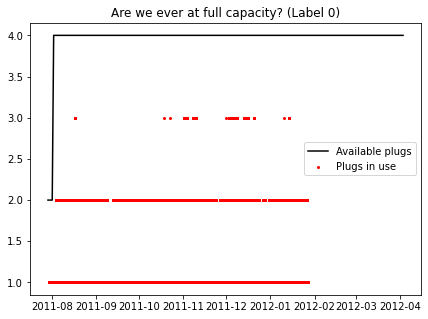

In [478]:
dfsimp2 = p2.copy().head(250)
plt.plot(dfsimp2[dfsimp2['Label'] == 0].index, dfsimp2[dfsimp2['Label'] == 0]['Plugs'], '-', color = 'black', label = 'Available plugs')
plt.scatter(dfsim2.index, dfsim2['Active plugs'], color = 'red', label = 'Plugs in use', alpha = 1, s = 4)
plt.legend()
plt.title('Are we ever at full capacity? (Label 0)')
plt.show()

In [348]:
24*365*8


70080

In [346]:
#    dr[f"Charge {index}"] = '0'
#    dr[f"Charge {index}"].loc[test['Start Date'][index]:test['End Date'][index]] = 1

In [347]:
#dr

,Charge 0,Charge 1,Charge 2,Charge 3,Charge 4,Charge 5,Charge 6,Charge 7,Charge 8,Charge 9,...,Charge 90,Charge 91,Charge 92,Charge 93,Charge 94,Charge 95,Charge 96,Charge 97,Charge 98,Charge 99
2011-07-29 20:17:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2011-07-29 20:18:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2011-07-29 20:19:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2011-07-29 20:20:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2011-07-29 20:21:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-08-22 18:45:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2011-08-22 18:46:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2011-08-22 18:47:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2011-08-22 18:48:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


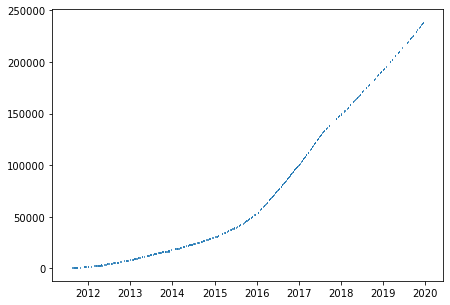

In [288]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax = plt.hlines(test.index, test['Start Date'], test['End Date'])

In [289]:
#df.apply(lambda row: days_prev_holiday(row['Date'], holidays), axis=1)
def overlapping(start, end):
    overlaps = len(test[(test['Start Date'] > start) & (test['Start Date'] < end)])
    return(overlaps)


In [290]:
test['UsedSimultaneously'] = (test.apply(lambda row: overlapping(row['Start Date'], row['End Date']), axis=1))


In [291]:
test

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon,UsedSimultaneously
0,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-29 20:17:00,2011-07-29 23:20:00,183.533333,114.050000,6.249457,2,J1772,37.444572,-122.160309,0.00,0,37.4445,-122.16,0
1,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 00:00:00,2011-07-30 00:02:00,2.100000,1.900000,0.106588,2,J1772,37.444572,-122.160309,0.00,0,37.4445,-122.16,0
2,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 08:16:00,2011-07-30 12:34:00,257.533333,257.466667,14.951777,2,J1772,37.444572,-122.160309,0.00,0,37.4445,-122.16,0
3,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 14:51:00,2011-07-30 16:55:00,123.400000,122.966667,7.159643,2,J1772,37.444572,-122.160309,0.00,0,37.4445,-122.16,0
4,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2011-07-30 18:51:00,2011-07-30 20:03:00,71.400000,43.900000,1.957765,2,J1772,37.444572,-122.160309,0.00,0,37.4445,-122.16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239285,PALO ALTO CA / HAMILTON #2,0024B1000002965D,2019-12-31 13:41:00,2019-12-31 14:23:00,41.450000,40.633333,3.737000,2,J1772,37.444706,-122.160324,0.86,0,37.4445,-122.16,0
239294,PALO ALTO CA / HAMILTON #2,0024B1000002965D,2019-12-31 15:10:00,2019-12-31 18:03:00,173.083333,172.883333,16.126000,2,J1772,37.444706,-122.160324,3.71,0,37.4445,-122.16,1
239305,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2019-12-31 17:26:00,2019-12-31 17:59:00,33.350000,32.650000,2.970000,2,J1772,37.444489,-122.160370,0.68,0,37.4445,-122.16,0
239309,PALO ALTO CA / HAMILTON #2,0024B1000002965D,2019-12-31 18:30:00,2019-12-31 19:44:00,73.766667,72.816667,6.739000,2,J1772,37.444706,-122.160324,1.55,0,37.4445,-122.16,1


In [295]:
test[test['UsedSimultaneously'] > 4]

,Station Name,MAC Address,Start Date,End Date,Total Duration (mins),Charging Time (mins),Energy (kWh),Port Number,Plug Type,Latitude,Longitude,Fee (USD),Label,CenterLat,CenterLon,UsedSimultaneously
2389,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2012-03-27 14:40:00,2012-05-09 12:43:00,1379.983333,84.383333,0.476540,1,NEMA 5-20R,37.444489,-122.160370,0.00,0,37.4445,-122.16,315
4611,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2012-07-25 19:30:00,2012-07-27 01:46:00,700.233333,180.183333,10.391167,2,J1772,37.444489,-122.160370,0.00,0,37.4445,-122.16,5
5214,PALO ALTO CA / HAMILTON #2,000D6F00009ED39E,2012-08-29 12:13:00,2012-08-29 19:59:00,466.166667,108.000000,9.581229,2,J1772,37.444607,-122.160263,0.00,0,37.4445,-122.16,5
6350,PALO ALTO CA / HAMILTON #2,000D6F00009ED39E,2012-10-24 08:59:00,2012-10-24 17:59:00,539.916667,271.033333,15.330697,2,J1772,37.444607,-122.160263,0.00,0,37.4445,-122.16,5
6372,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2012-10-25 09:02:00,2012-10-25 17:28:00,505.916667,496.750000,4.011142,1,NEMA 5-20R,37.444489,-122.160370,0.00,0,37.4445,-122.16,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236052,PALO ALTO CA / HAMILTON #2,0024B1000002965D,2019-12-05 08:42:00,2019-12-05 12:22:00,219.933333,219.700000,20.282000,2,J1772,37.444706,-122.160324,4.66,0,37.4445,-122.16,6
236391,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2019-12-07 11:24:00,2019-12-07 16:27:00,303.616667,237.916667,17.516000,2,J1772,37.444489,-122.160370,4.03,0,37.4445,-122.16,8
236951,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2019-12-11 13:28:00,2019-12-11 17:23:00,235.583333,117.566667,10.085000,2,J1772,37.444489,-122.160370,2.32,0,37.4445,-122.16,5
238052,PALO ALTO CA / HAMILTON #1,000D6F00015A9D76,2019-12-18 16:30:00,2019-12-18 21:00:00,269.750000,114.833333,5.061000,2,J1772,37.444489,-122.160370,1.16,0,37.4445,-122.16,5


### Downsampling 

In [29]:
def proportionalsplit(s, freq="2H"):
    '''
    From StackOverflow: https://stackoverflow.com/questions/66274081/how-to-discretize-time-series-with-overspilling-durations/66280942#66280942
    '''
    st = s["Start Date"]
    etCharge = st + pd.Timedelta(minutes=s["Charging Time (mins)"])
    trCharge = pd.date_range(st.floor(freq), etCharge, freq=freq)
    etPark = st + pd.Timedelta(minutes=s["Total Duration (mins)"])
    trPark = pd.date_range(st.floor(freq), etPark, freq=freq)
    lmin = {"2H":120}
    #print(etCharge)
    #print(trCharge)
    #print(etPark)
    #print(trPark)
    
    # ratio of how numeric values should be split across new buckets
    ratioCharge = np.minimum((np.where(trCharge<st, trCharge.shift()-st, etCharge-trCharge)/(10**9*60)).astype(int), np.full(len(trCharge),lmin[freq]))
    ratioCharge = ratioCharge / ratioCharge.sum()
    #print(ratioCharge)
    ratioPark = np.minimum((np.where(trPark<st, trPark.shift()-st, etPark-trPark)/(10**9*60)).astype(int), np.full(len(trPark),lmin[freq]))
    ratioPark = ratioCharge / ratioCharge.sum()
    #print(ratioPark)
    
    return {"Start Date":trCharge, "Original Charge Duration":np.full(len(trCharge), s["Charging Time (mins)"]), 
                "Original Park Duration":np.full(len(trCharge), s["Total Duration (mins)"]), 
                "Original Start":np.full(len(trCharge), s["Start Date"]), 
                "Charging Time (mins)": s["Charging Time (mins)"] * ratioCharge,
                "Parking Time (mins)": s["Total Duration (mins)"] * ratioPark,
                "Energy (kWh)": s["Energy (kWh)"] * ratioCharge,
                "CenterLon": np.full(len(trCharge),s["CenterLon"]), "CenterLat": np.full(len(trCharge),s["CenterLat"]), 
                "Fee (USD)": s["Fee (USD)"] * ratioCharge, 
                "Label": s["Label"]
            }

In [30]:
def downsampling_to_days(df):
    labels = df["Label"].unique()
    dfClean2 = pd.DataFrame(columns = df.columns[1:])
    for label in labels:
        d = df[df["Label"] == label].resample("D", on="Start Date").agg({'Charging Time (mins)':'sum','Parking Time (mins)':'sum', 'Energy (kWh)':'sum', 'Fee (USD)':'sum', 'CenterLon':'min', 'CenterLat':'min'}).fillna('')
        d["Label"] = label
        
        dfClean2 = dfClean2.append(d)
    
    dfClean2 = dfClean2.reset_index()
    dfClean2 = dfClean2.rename(columns = {"index":"Start Date"})
    
    new_col_order = ['Start Date','Label','Charging Time (mins)','Parking Time (mins)', 'Energy (kWh)', 'Fee (USD)', 'CenterLon', 'CenterLat']
    dfClean3 = dfClean2[new_col_order]
    return dfClean3

In [31]:
start_time = time.time()
df1 = pd.concat([pd.DataFrame(v) for v in df.apply(proportionalsplit, axis=1).values]).reset_index(drop=True)
print("This bastard took", (time.time() - start_time)/60, "minutes to run...")

This bastard took 9.980391303698221 minutes to run...


In [32]:
df1.isna().sum()

Start Date                  0
Original Charge Duration    0
Original Park Duration      0
Original Start              0
Charging Time (mins)        6
Parking Time (mins)         6
Energy (kWh)                6
CenterLon                   0
CenterLat                   0
Fee (USD)                   6
Label                       0
dtype: int64

#### THIS IS AN UGLY FIX THAT PERHAPS INDICATES THAT THERE'S SOMETHING WEIRD WITH proportionalsplit
(But it looks alright except for 6 generated NaNs...) 

In [33]:
df1x = df1.dropna()

#### Let's keep going

In [34]:
df1x = downsampling_to_days(df1x)
df1x.isna().sum()

Start Date              0
Label                   0
Charging Time (mins)    0
Parking Time (mins)     0
Energy (kWh)            0
Fee (USD)               0
CenterLon               0
CenterLat               0
dtype: int64

### Fill days without demand 

In [35]:
def fill_empty_days(df): 
    df = df.set_index("Start Date")
    df.index = df.index.to_period("D")
    labels = df.Label.unique()
    df_reindex = pd.DataFrame()
    idx = pd.period_range(min(df.index), max(df.index))
    for i in labels:
        #CenterLatitude = list(df[df.Label == i]['CenterLat'].unique())
        #CenterLongitude = list(df[df.Label == i]['CenterLon'].unique())
        #print(CenterLatitude)
        #print(CenterLongitude)
        
        filling = df[df.Label == i].reindex(idx, fill_value = 0)
        filling.Label = i
        filling.CenterLat = df['CenterLat'][df.Label == i][0]
        filling.CenterLon = df['CenterLon'][df.Label == i][0]

        df_reindex = df_reindex.append(filling)
        
    
    df = df_reindex.sort_index()
    
    return df 

In [36]:
df1x = fill_empty_days(df1x)
df1x.isna().sum()

Label                   0
Charging Time (mins)    0
Parking Time (mins)     0
Energy (kWh)            0
Fee (USD)               0
CenterLon               0
CenterLat               0
dtype: int64

In [37]:
df1x.head()

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),CenterLon,CenterLat
2011-07-29,0,114.05,183.533333,6.249457,0.0,-122.160258,37.444544
2011-07-29,1,0.00,0.000000,0.000000,0.0,-122.113337,37.422125
2011-07-29,2,0.00,0.000000,0.000000,0.0,-122.138897,37.445497
2011-07-29,5,0.00,0.000000,0.000000,0.0,-122.163012,37.443428
2011-07-29,6,0.00,0.000000,0.000000,0.0,-122.146024,37.426246


### External data
#### POIs

In [38]:
#Get POIs 
#.... And POIs within distance 
dfPOI= pd.read_csv('C:\\Users\\User\\OneDrive - Danmarks Tekniske Universitet\\SAS_030919\\6. Semester\\BSc\\Bachelor2021\\data\\createdDat\\points_of_int.csv', low_memory = False)
dfPOI = dfPOI.drop(columns = 'Unnamed: 0')

In [39]:
dfPOI.head()

,Name,Latitude,Longitude,Category,Sub Category
0,Zydeco Party,37.452546,-122.112660,Arts & Entertainment,Music Venue
1,Delta Chi Alumni,37.450602,-122.114825,College & University,Fraternity House
2,Phi Beta Pi Alumni,37.452672,-122.113965,College & University,Fraternity House
3,Delta Delta Delta Alumni,37.450842,-122.114379,College & University,Fraternity House
4,Mama's Taco Wagon,37.450386,-122.116925,Food,Food Truck


In [40]:
def distance_calc (row, label): #inspired by https://stackoverflow.com/questions/44446862/calculate-distance-between-latitude-and-longitude-in-dataframe
    POIlocation = (row['Latitude'], row['Longitude'])
    LabelX = (row['Label'+ str(label) +'_Lat'], row['Label'+ str(label) +'_Lon'])
    return distance.distance(POIlocation, LabelX).meters

In [41]:
def POIs_within_radius(df, df_poi, radius):
    #Ad-hoc solution to keep date
    df = df.reset_index() 
    df = df.rename(columns = {'index': 'Date'})
    df['Date'] = df['Date'].dt.to_timestamp('s')
    
    df_unique_label = df.groupby('Label', group_keys=False).apply(lambda df: df.sample(1))
    df_unique_label = df_unique_label[['Label','CenterLat', 'CenterLon']]
    df_unique_label = df_unique_label.set_index('Label')
    
    for i in range(len(df_unique_label)): 
        df_poi['Label' + str(i) + '_Lat'] = df_unique_label.at[i,'CenterLat']
        df_poi['Label' + str(i) + '_Lon'] = df_unique_label.at[i,'CenterLon']
    
    for j in range(len(df_unique_label)): 
        df_poi[str(j) + '_Distance'] = df_poi.apply (lambda row: distance_calc (row, j),axis=1)
    fill = pd.DataFrame()
    for k in range(len(df_unique_label)):
        m = radius 
        LabelY = pd.DataFrame(df_poi[df_poi[(str(k) + '_Distance')] < m]['Category'].value_counts())
        LabelY = LabelY.rename(columns={"Category": k})
        LabelY = LabelY.T
        fill = fill.append(LabelY)
    fill = fill.reset_index()
    fill = fill.rename(columns={"index": "Label"})
    category_names = list(fill.columns[1:])
    category_names_count = ['# ' + x for x in category_names]
    fill = fill.rename(columns = dict(zip(category_names, category_names_count)))
    
    result = df.merge(fill, on = "Label")
    # result = result.drop(columns = [# Event])
    #Ad-hoc solution to keep date
    result = result.set_index('Date')
    result = result.drop(columns = ['CenterLon', 'CenterLat'])
    return result

In [42]:
start_time = time.time()
df1x = POIs_within_radius(df1x, dfPOI, 500)
print("This bastard took", (time.time() - start_time)/60, "minutes to run...")

This bastard took 0.25968406995137533 minutes to run...


In [43]:
df1x

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Professional & Other Places,# Food,# Shop & Service,# Travel & Transport,# Outdoors & Recreation,# Arts & Entertainment,# Nightlife Spot,# Residence,# College & University,# Event
Date,,,,,,,,,,,,,,,
2011-07-29,0,114.050000,183.533333,6.249457,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0
2011-07-30,0,517.200000,686.650000,28.978653,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0
2011-07-31,0,647.866667,725.983333,37.209163,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0
2011-08-01,0,95.133333,203.566667,5.041244,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0
2011-08-02,0,279.983333,280.316667,16.210423,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,3,1320.766667,1501.966667,100.728000,24.500000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0
2019-12-28,3,545.383333,620.633333,46.182000,11.000000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0
2019-12-29,3,755.300000,971.516667,61.271000,15.090000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0


In [44]:
df1x.isna().sum()

Label                                0
Charging Time (mins)                 0
Parking Time (mins)                  0
Energy (kWh)                         0
Fee (USD)                            0
# Professional & Other Places        0
# Food                               0
# Shop & Service                     0
# Travel & Transport              3078
# Outdoors & Recreation              0
# Arts & Entertainment               0
# Nightlife Spot                  6156
# Residence                       3078
# College & University            3078
# Event                          12312
dtype: int64

### Folium plot with POIs

In [96]:
dfPOI['Category'].unique()

array(['Arts & Entertainment', 'College & University', 'Food',
       'Outdoors & Recreation', 'Professional & Other Places',
       'Shop & Service', 'Travel & Transport', 'Nightlife Spot',
       'Residence', 'Event'], dtype=object)

In [98]:
len(dfPOI)

8676

In [103]:
len(dfPOI['Name'].unique())

3378

In [118]:
POI = dfPOI.copy()
POI['Category'] = pd.Categorical(POI['Category'])
POI['CatCode'] = POI['Category'].cat.codes
POI[['Category', 'CatCode']].drop_duplicates().sort_values('CatCode')

,Category,CatCode
0,Arts & Entertainment,0
1,College & University,1
846,Event,2
4,Food,3
232,Nightlife Spot,4
7,Outdoors & Recreation,5
15,Professional & Other Places,6
407,Residence,7
53,Shop & Service,8
63,Travel & Transport,9


In [111]:
POI.head(1)

,Name,Latitude,Longitude,Category,Sub Category,Label0_Lat,Label0_Lon,Label1_Lat,Label1_Lon,Label2_Lat,...,Label7_Lon,0_Distance,1_Distance,2_Distance,3_Distance,4_Distance,5_Distance,6_Distance,7_Distance,CatCode
0,Zydeco Party,37.452546,-122.11266,Arts & Entertainment,Music Venue,37.444544,-122.160258,37.446603,-122.162217,37.443428,...,-122.146024,4304.376051,4434.338396,4568.959618,4052.862614,2449.890286,3376.7957,3862.166807,4151.893294,0


In [145]:
m2 = folium.Map(location=[37.435, -122.16], tiles="Stamen Toner", zoom_start=13)

In [146]:
colors = ['red','blue','yellow','orange','black','green','purple', 'lightgreen', 'black', 'cyan']
#colors = ['red', 'orange', 'yellow', 'green', 'cyan', 'blue', 'purple', 'black']
#markers = ['palette', 'graduation-cap', 'calendar', 'utensils', 'beer', 'campground', 'briefcase', 'home', 'store', 'subway']
#colors = ['red', 'orange', 'gray', 'green', 'darkgreen', 'blue', 'purple', 'black']


#cols = dict(zip(groups,colors))

#macs = df['MAC Address'].unique()
#pois = dfPOI['Name']


for index, row in POI.iterrows():
    #poiname = row['Name']
    poilat = row['Latitude']
    poilon = row['Longitude']
    poicat = row['Category']
    poicatcode = row['CatCode']

    folium.Circle(radius = 5, fill = True, fill_opacity=0.6,
                  location = [poilat, poilon],
                  color = colors[poicatcode],
                  popup = poicat).add_to(m2)
    
#    folium.Circle(icon=folium.Icon(color=colors[poicatcode], icon=markers[poicatcode], prefix='fa'),
#                  location = [poilat, poilon]#, popup= f"Station Name: {macstationname}\nLabel: {maclabel}"
#                  ).add_to(m)

labels = df['Label'].unique()
for label in labels: 
    centerlat = df[df['Label'] == label]['CenterLat'].min()
    centerlon = df[df['Label'] == label]['CenterLon'].min()
    
    folium.Marker(icon=folium.Icon(color='gray', icon = 'plug', prefix='fa'),
                  location = [centerlat, centerlon], color = 'gray',
                  ).add_to(m2)
    

In [147]:
m2

### Available ports at cluster for a given time. 

In [57]:
#Create port number (how?!) Should lead to number of ports in cluster at time 

In [45]:
#Does any mac address change label? 
mac = df['MAC Address'].unique() 
for m in mac: 
    cluster = df[df['MAC Address'] == m]['Label'].unique()
    if len(cluster) > 1: 
        print(f"{m} can be found in clusters {cluster}")

In [46]:
#Does any have both types of plugs? 
mac = df['MAC Address'].unique() 
for m in mac: 
    Ptype = df[df['MAC Address'] == m]['Plug Type'].unique()
    if len(Ptype) > 1: 
        print(f"{m} has {Ptype}")

000D6F00015A9D76 has ['J1772' 'NEMA 5-20R']
000D6F00009ED39E has ['J1772' 'NEMA 5-20R']
000D6F0000A20F47 has ['J1772' 'NEMA 5-20R']
000D6F0000A2108E has ['J1772' 'NEMA 5-20R']
000D6F0000A20D9E has ['J1772' 'NEMA 5-20R']
000D6F00009DCFC3 has ['J1772' 'NEMA 5-20R']
000D6F00009ED727 has ['J1772' 'NEMA 5-20R']
000D6F00009DCC2B has ['J1772' 'NEMA 5-20R']
000D6F00015A96E4 has ['J1772' 'NEMA 5-20R']
000D6F00009ED39E_BRYANT has ['J1772' 'NEMA 5-20R']
000D6F00015B9402 has ['J1772' 'NEMA 5-20R']
000D6F00009D9A1B has ['NEMA 5-20R' 'J1772']


In [47]:
labels = df['Label'].unique()
labels = np.sort(labels)
for l in labels: 
    print(f"Cluster {l}:\n")
    labelmac = df[df['Label'] == l]['MAC Address'].unique()
    for m in labelmac: 
        sdate = df[(df['Label'] == l) & (df['MAC Address'] == m)]['Start Date'].min().date()
        edate = df[(df['Label'] == l) & (df['MAC Address'] == m)]['End Date'].max().date()
        plugnr = len(df[(df['Label'] == l) & (df['MAC Address'] == m)]['Port Number'].unique())

        Ptype = df[(df['Label'] == l) & (df['MAC Address'] == m)]['Plug Type'].unique()
        
        print(f"{m} is used {sdate} to {edate} and has {plugnr} plug(s) of type {Ptype}")
    print(' ')

Cluster 0:

000D6F00015A9D76 is used 2011-07-29 to 2019-12-31 and has 2 plug(s) of type ['J1772' 'NEMA 5-20R']
000D6F00009ED39E is used 2011-08-02 to 2016-01-12 and has 2 plug(s) of type ['J1772' 'NEMA 5-20R']
0024B10000021331 is used 2016-01-12 to 2017-08-22 and has 2 plug(s) of type ['J1772']
0024B100000203AD is used 2017-08-23 to 2017-11-07 and has 2 plug(s) of type ['J1772']
0024B1000002965D is used 2017-11-07 to 2019-12-31 and has 2 plug(s) of type ['J1772']
 
Cluster 1:

000D6F000154FB5F is used 2014-09-24 to 2015-08-27 and has 1 plug(s) of type ['J1772']
000D6F00015B7509 is used 2014-09-24 to 2019-01-25 and has 1 plug(s) of type ['J1772']
000D6F000154EF9A is used 2014-09-24 to 2019-12-17 and has 1 plug(s) of type ['J1772']
000D6F000154FFDB is used 2014-09-27 to 2016-01-14 and has 1 plug(s) of type ['J1772']
000D6F000154FFC5 is used 2014-09-28 to 2019-06-09 and has 1 plug(s) of type ['J1772']
000D6F00015B906A is used 2014-10-05 to 2019-12-31 and has 1 plug(s) of type ['J1772']
00

In [242]:
#The port types available could definately be something worth taking into account. 

#### Plug sum!

In [55]:
labels = df['Label'].unique()
labels = np.sort(labels)
plugdf = pd.DataFrame() #pd.DataFrame(index = pd.date_range(start =df['Start Date'].min().date(), end = df['End Date'].max().date(), freq = 'D'))
#plugdf['Label'] = np.nan
for l in labels: 
    #print(f"Cluster {l}:\n")
    labelmac = df[df['Label'] == l]['MAC Address'].unique()
    lplugdf = pd.DataFrame(index = pd.date_range(start = df[df['Label'] == l]['Start Date'].min().date(), end = df[df['Label'] == l]['End Date'].max().date(), freq = 'D'))
    
    for m in labelmac: 
        sdate = df[(df['Label'] == l) & (df['MAC Address'] == m)]['Start Date'].min().date()
        edate = df[(df['Label'] == l) & (df['MAC Address'] == m)]['End Date'].max().date()
        
        plugnr = len(df[(df['Label'] == l) & (df['MAC Address'] == m)]['Port Number'].unique())
        
        MACplugdf = pd.DataFrame(index = pd.date_range(start = sdate, end = edate, freq = 'D'))
        MACplugdf[f'{m}_plugs'] = plugnr
        #print(f"{m} is used {sdate} to {edate} and has {plugnr} plug(s)")
        lplugdf = pd.merge(lplugdf,MACplugdf, how='left', left_index=True, right_index=True)
        #print(lplugdf[~lplugdf[f'{m}_plugs'].isna()].head(2))
    lplugdf["Plugs"] = lplugdf.sum(axis=1)
    lplugdf['Label'] = l
    
    totplugs = lplugdf[['Label', 'Plugs']]
    totplugs['Plugs'][-30:] = totplugs['Plugs'][-30:].max() #A bit sneaky but makes sure that stations randomly not being used at the end (earlier stop date) doesn't affect nr of available stations
    
    #Fill until 2019-12-31
    
    plugdf = pd.concat([plugdf, totplugs], sort=False)
    #print(plugdf.tail(1))

In [244]:
#test = plugdf[plugdf['Label'] == 6]
#test = test.reset_index()
#test

In [245]:
#test[(test['Plugs'] != test.shift(-1)['Plugs']) & (test.shift(-1)['Plugs'] != test.shift(-7)['Plugs'])]

In [183]:
#p2 = plugdf.copy()

In [184]:
#p2[(p2['Label'] == 0) & (p2['Plugs'] != p2.shift(-1)['Plugs'])]

In [185]:
#p2['Plugs'].head(2)

In [186]:
#p2.shift(-1)['Plugs'].tail(2) #Fill this last value and it'll work! 

In [187]:
#p2[p2.index == '2019-12-24'].head(10)
#pd.date_range(start = '2019-12-24', end = (pd.Timestamp('2019-12-24') + dt.timedelta(days = 7)), freq = 'D')

In [188]:
#p2 = plugdf.copy()
#for l in range(7): 
#    print(f"Label: {l}")
#    nextday = p2.shift(-1)
#    nextday['Plugs'][-1] = nextday['Plugs'][-2]
#    #weekbefore = p2.shift(7)
#    #weekafter = p2.shift(-7)
#    #weekbefore['Label'][0:7] = weekbefore['Label'][8] 
#    #weekbefore['Plugs'][0:7] = weekbefore['Plugs'][8]
#    #weekafter['Label'][-7:] = weekafter['Label'][-8] 
#    #weekafter['Plugs'][-7:] = weekafter['Plugs'][-8]
#    
#    #The days that doesn't have the same the next day 
#    #idx = p2[(p2['Label'] == label) & (p2['Plugs'] != weekbefore['Plugs']) & (p2['Plugs'] != weekafter['Plugs'])].index # & (p2.shift(-1)['Plugs'] != p2.shift(-14)['Plugs'])].index
#
#    idx = p2[(p2['Label'] == l) & (p2['Plugs'] != nextday['Plugs'])].index # & (p2.shift(-1)['Plugs'] != p2.shift(-14)['Plugs'])].index
#    #get rid of last one if it's at the end! 
#    try: 
#        idx = idx.drop(pd.Timestamp('2019-12-31'))
#    except: 
#        pass
#    
#    #How long does the change last for? 
#    #If days <week  -> set the value as the end of the week
#    #elif days > week -> keep value 
#    #print(idx)
#    
#    
#    for i in idx: #(idx + dt.timedelta(days = 1)): #The days where the actual change occur (the next day)
#        dayD = i + dt.timedelta(days = 1)
#        followingweek = pd.date_range(start = dayD, end = (dayD + dt.timedelta(days = 7)), freq='D') 
#        
#        stae = (p2['Plugs'][(p2['Label'] == l) & (p2.index.isin(followingweek))].mean() != p2['Plugs'][(p2['Label'] == l) & (p2.index == dayD)])
#             # and p2['Plugs'][(p2['Label'] == l) & (p2.index == i)] == p2['Plugs'][(p2['Label'] == l) & (p2.index == (idt.timedelta(days = 7)))])
#        print(stae)
#        #if (p2['Plugs'][(p2['Label'] == l) & (p2.index.isin(followingweek))].mean() != p2['Plugs'][(p2['Label'] == l) & (p2.index == dayD)]
#        #    and p2['Plugs'][(p2['Label'] == l) & (p2.index == i)] == p2['Plugs'][(p2['Label'] == l) & (p2.index == (idt.timedelta(days = 7)))]):
#        #    
#        #    inn = p2['Plugs'][(p2['Label'] == l)&(p2.index == (i+dt.timedelta(days = 7)))]
#        #    p2['Plugs'][(p2['Label'] == l) & (p2.index == dayD)] = int(inn)
#        #
#        #else: 
#        #    pass
#        #elif: (p2['Plugs'][(p2['Label'] == l) & (p2.index.isin(followingweek))].mean() != p2['Plugs'][(p2['Label'] == l) & (p2.index == dayD)]
#        #    and p2['Plugs'][(p2['Label'] == l) & (p2.index == i)] != p2['Plugs'][(p2['Label'] == l) & (p2.index == (idt.timedelta(days = 7)))]):
#        #        pass
#            
#            
#    
#        
#        
#        
#    
#        #print(i)
#        #inn = p2['Plugs'][(p2['Label'] == label)&(p2.index == (i+dt.timedelta(days = 7)))]
#        #inn2 = int(inn)
#        #p2[p2['Label'] == label].at[(i+dt.timedelta(days = 14)),'Plugs']
#        #print(inn)
#        #try: 
#        #    p2['Plugs'][(p2['Label'] == label) & (p2.index == i)] = int(inn)
#        #except: 
#        #    pass
#        
#        
#    
#    #print(f"Label: {label}")
#    #print(idx+ dt.timedelta(days = 1))# + dt.timedelta(days = 1)

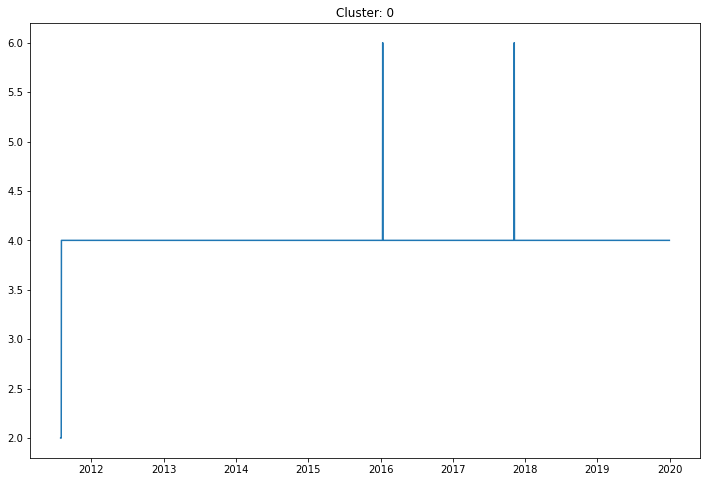

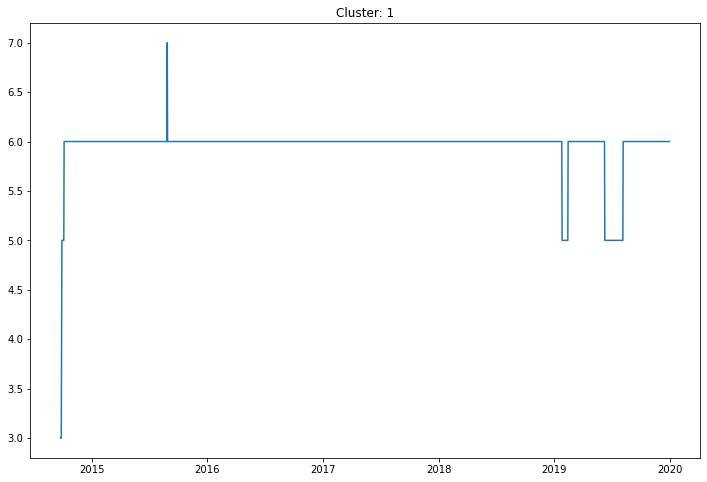

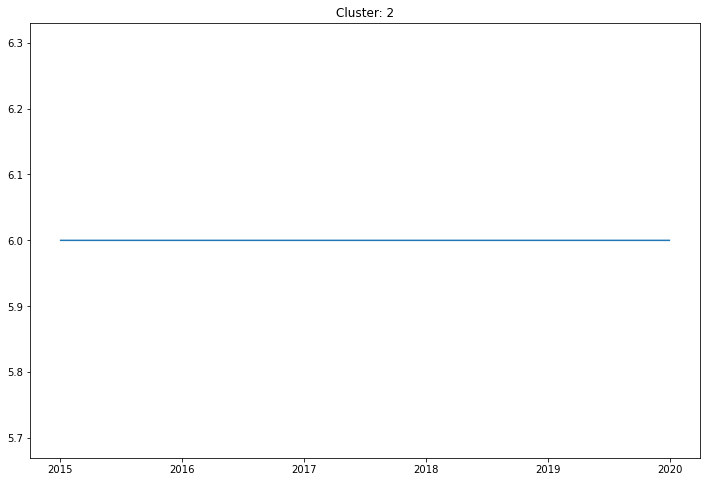

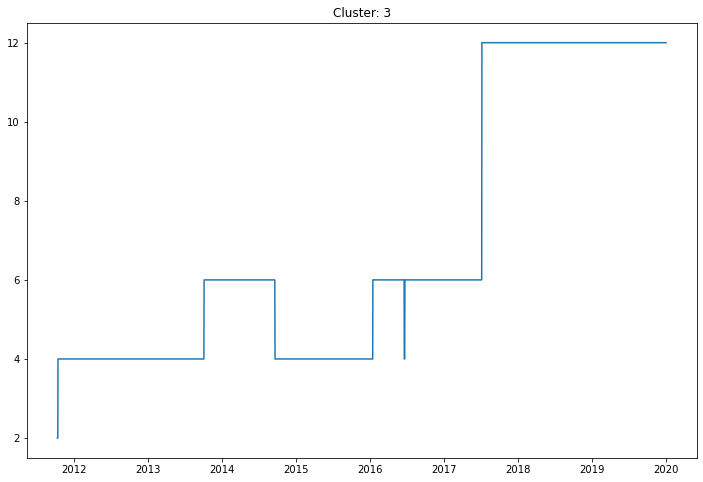

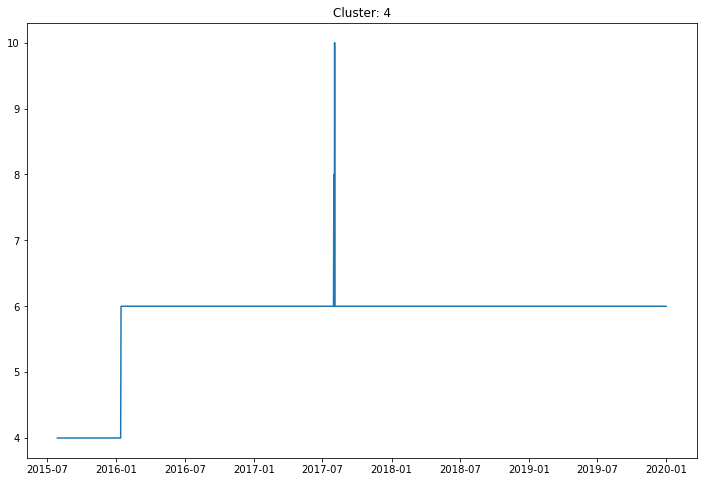

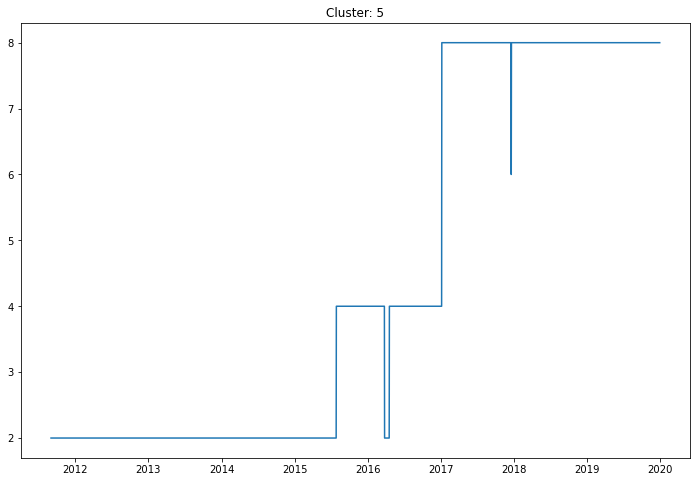

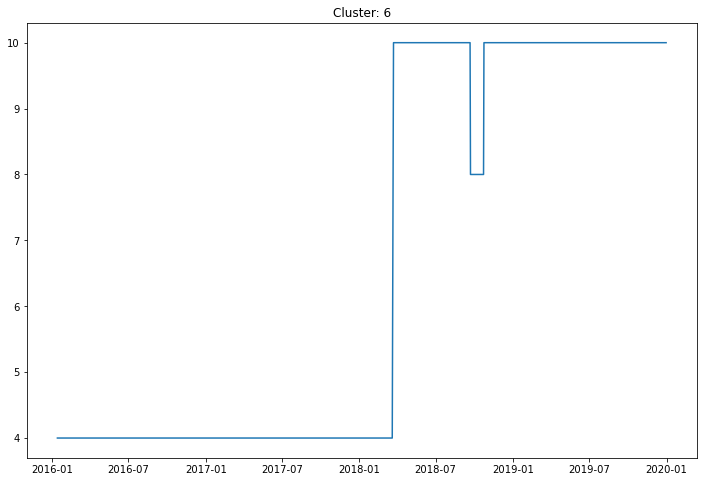

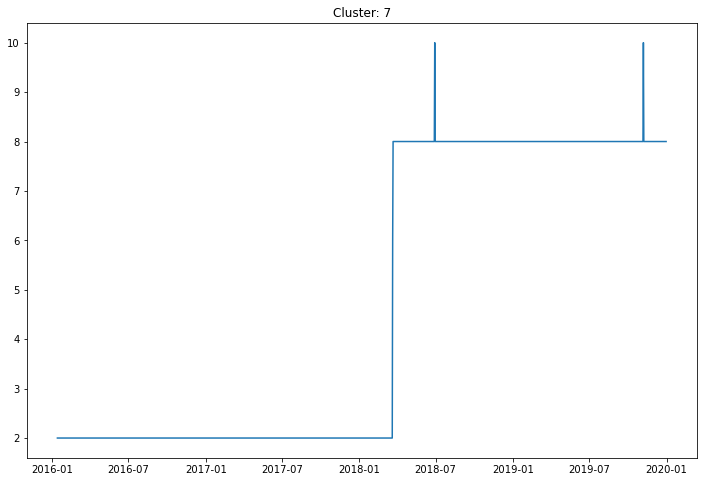

In [56]:
plt.rcParams['figure.figsize'] = [12, 8]
for l in range(len(df['Label'].unique())): 
    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Plugs'])
    plt.title(f"Cluster: {l}")
    plt.show()

Those temporary spikes due to eg maintanence are seen as outliers and should be removed. 

### FUCK IT! Let's hardcode it... 

In [57]:
from IPython.display import display

for l in range(len(df['Label'].unique())): 
    print(f"Label: {l}")
    nextday = plugdf.shift(-1)
    nextday['Plugs'][-1] = nextday['Plugs'][-2]
    idx = plugdf[(plugdf['Label'] == l) & (plugdf['Plugs'] != nextday['Plugs'])].index 
    try: 
        idx = idx.drop(pd.Timestamp('2019-12-31'))
    except: 
        pass
    
    for i in idx + dt.timedelta(days = 1): 
        weekofchange = plugdf[(plugdf['Label'] == l)].loc[pd.date_range(start = (i - dt.timedelta(days = 1)), end = (i + dt.timedelta(days = 3)))] # & (plugdf.index > '2016-01-11')
        display(weekofchange)
    

Label: 0


,Label,Plugs
2011-08-01,0,2.0
2011-08-02,0,4.0
2011-08-03,0,4.0
2011-08-04,0,4.0
2011-08-05,0,4.0


,Label,Plugs
2016-01-11,0,4.0
2016-01-12,0,6.0
2016-01-13,0,4.0
2016-01-14,0,4.0
2016-01-15,0,4.0


,Label,Plugs
2016-01-12,0,6.0
2016-01-13,0,4.0
2016-01-14,0,4.0
2016-01-15,0,4.0
2016-01-16,0,4.0


,Label,Plugs
2017-11-06,0,4.0
2017-11-07,0,6.0
2017-11-08,0,4.0
2017-11-09,0,4.0
2017-11-10,0,4.0


,Label,Plugs
2017-11-07,0,6.0
2017-11-08,0,4.0
2017-11-09,0,4.0
2017-11-10,0,4.0
2017-11-11,0,4.0


Label: 1


,Label,Plugs
2014-09-26,1,3.0
2014-09-27,1,4.0
2014-09-28,1,5.0
2014-09-29,1,5.0
2014-09-30,1,5.0


,Label,Plugs
2014-09-27,1,4.0
2014-09-28,1,5.0
2014-09-29,1,5.0
2014-09-30,1,5.0
2014-10-01,1,5.0


,Label,Plugs
2014-10-04,1,5.0
2014-10-05,1,6.0
2014-10-06,1,6.0
2014-10-07,1,6.0
2014-10-08,1,6.0


,Label,Plugs
2015-08-26,1,6.0
2015-08-27,1,7.0
2015-08-28,1,6.0
2015-08-29,1,6.0
2015-08-30,1,6.0


,Label,Plugs
2015-08-27,1,7.0
2015-08-28,1,6.0
2015-08-29,1,6.0
2015-08-30,1,6.0
2015-08-31,1,6.0


,Label,Plugs
2019-01-25,1,6.0
2019-01-26,1,5.0
2019-01-27,1,5.0
2019-01-28,1,5.0
2019-01-29,1,5.0


,Label,Plugs
2019-02-13,1,5.0
2019-02-14,1,6.0
2019-02-15,1,6.0
2019-02-16,1,6.0
2019-02-17,1,6.0


,Label,Plugs
2019-06-09,1,6.0
2019-06-10,1,5.0
2019-06-11,1,5.0
2019-06-12,1,5.0
2019-06-13,1,5.0


,Label,Plugs
2019-08-06,1,5.0
2019-08-07,1,6.0
2019-08-08,1,6.0
2019-08-09,1,6.0
2019-08-10,1,6.0


Label: 2
Label: 3


,Label,Plugs
2011-10-12,3,2.0
2011-10-13,3,4.0
2011-10-14,3,4.0
2011-10-15,3,4.0
2011-10-16,3,4.0


,Label,Plugs
2013-10-02,3,4.0
2013-10-03,3,6.0
2013-10-04,3,6.0
2013-10-05,3,6.0
2013-10-06,3,6.0


,Label,Plugs
2014-09-17,3,6.0
2014-09-18,3,4.0
2014-09-19,3,4.0
2014-09-20,3,4.0
2014-09-21,3,4.0


,Label,Plugs
2016-01-13,3,4.0
2016-01-14,3,6.0
2016-01-15,3,6.0
2016-01-16,3,6.0
2016-01-17,3,6.0


,Label,Plugs
2016-06-16,3,6.0
2016-06-17,3,4.0
2016-06-18,3,4.0
2016-06-19,3,4.0
2016-06-20,3,6.0


,Label,Plugs
2016-06-19,3,4.0
2016-06-20,3,6.0
2016-06-21,3,6.0
2016-06-22,3,6.0
2016-06-23,3,6.0


,Label,Plugs
2017-07-04,3,6.0
2017-07-05,3,12.0
2017-07-06,3,12.0
2017-07-07,3,12.0
2017-07-08,3,12.0


Label: 4


,Label,Plugs
2016-01-13,4,4.0
2016-01-14,4,6.0
2016-01-15,4,6.0
2016-01-16,4,6.0
2016-01-17,4,6.0


,Label,Plugs
2017-07-31,4,6.0
2017-08-01,4,8.0
2017-08-02,4,6.0
2017-08-03,4,10.0
2017-08-04,4,6.0


,Label,Plugs
2017-08-01,4,8.0
2017-08-02,4,6.0
2017-08-03,4,10.0
2017-08-04,4,6.0
2017-08-05,4,6.0


,Label,Plugs
2017-08-02,4,6.0
2017-08-03,4,10.0
2017-08-04,4,6.0
2017-08-05,4,6.0
2017-08-06,4,6.0


,Label,Plugs
2017-08-03,4,10.0
2017-08-04,4,6.0
2017-08-05,4,6.0
2017-08-06,4,6.0
2017-08-07,4,6.0


Label: 5


,Label,Plugs
2015-07-28,5,2.0
2015-07-29,5,4.0
2015-07-30,5,4.0
2015-07-31,5,4.0
2015-08-01,5,4.0


,Label,Plugs
2016-03-25,5,4.0
2016-03-26,5,2.0
2016-03-27,5,2.0
2016-03-28,5,2.0
2016-03-29,5,2.0


,Label,Plugs
2016-04-18,5,2.0
2016-04-19,5,4.0
2016-04-20,5,4.0
2016-04-21,5,4.0
2016-04-22,5,4.0


,Label,Plugs
2017-01-05,5,4.0
2017-01-06,5,8.0
2017-01-07,5,8.0
2017-01-08,5,8.0
2017-01-09,5,8.0


,Label,Plugs
2017-12-18,5,8.0
2017-12-19,5,6.0
2017-12-20,5,8.0
2017-12-21,5,8.0
2017-12-22,5,8.0


,Label,Plugs
2017-12-19,5,6.0
2017-12-20,5,8.0
2017-12-21,5,8.0
2017-12-22,5,8.0
2017-12-23,5,8.0


Label: 6


,Label,Plugs
2018-03-20,6,4.0
2018-03-21,6,6.0
2018-03-22,6,8.0
2018-03-23,6,10.0
2018-03-24,6,10.0


,Label,Plugs
2018-03-21,6,6.0
2018-03-22,6,8.0
2018-03-23,6,10.0
2018-03-24,6,10.0
2018-03-25,6,10.0


,Label,Plugs
2018-03-22,6,8.0
2018-03-23,6,10.0
2018-03-24,6,10.0
2018-03-25,6,10.0
2018-03-26,6,10.0


,Label,Plugs
2018-09-21,6,10.0
2018-09-22,6,8.0
2018-09-23,6,8.0
2018-09-24,6,8.0
2018-09-25,6,8.0


,Label,Plugs
2018-10-23,6,8.0
2018-10-24,6,10.0
2018-10-25,6,10.0
2018-10-26,6,10.0
2018-10-27,6,10.0


Label: 7


,Label,Plugs
2018-03-20,7,2.0
2018-03-21,7,6.0
2018-03-22,7,8.0
2018-03-23,7,8.0
2018-03-24,7,8.0


,Label,Plugs
2018-03-21,7,6.0
2018-03-22,7,8.0
2018-03-23,7,8.0
2018-03-24,7,8.0
2018-03-25,7,8.0


,Label,Plugs
2018-06-28,7,8.0
2018-06-29,7,10.0
2018-06-30,7,8.0
2018-07-01,7,8.0
2018-07-02,7,8.0


,Label,Plugs
2018-06-29,7,10.0
2018-06-30,7,8.0
2018-07-01,7,8.0
2018-07-02,7,8.0
2018-07-03,7,8.0


,Label,Plugs
2019-11-06,7,8.0
2019-11-07,7,10.0
2019-11-08,7,8.0
2019-11-09,7,8.0
2019-11-10,7,8.0


,Label,Plugs
2019-11-07,7,10.0
2019-11-08,7,8.0
2019-11-09,7,8.0
2019-11-10,7,8.0
2019-11-11,7,8.0


In [61]:
#Hardcoding bonanza :/ 
p2 = plugdf.copy()
#Label 0
p2['Plugs'][(p2['Label'] == 0)&(p2.index == '2016-01-12')] = 4
p2['Plugs'][(p2['Label'] == 0)&(p2.index == '2017-11-07')] = 4

#Label 1
p2['Plugs'][(p2['Label'] == 1)&(p2.index == '2015-08-27')] = 6

#p2['Plugs'][(p2['Label'] == 1)&(p2.index == '2016-06-17')] = 6
#p2['Plugs'][(p2['Label'] == 1)&(p2.index == '2016-06-18')] = 6
#p2['Plugs'][(p2['Label'] == 1)&(p2.index == '2016-06-19')] = 6

#Label 2
#-
#p2['Plugs'][(p2['Label'] == 2)&(p2.index == '2017-12-19')] = 8


#Label 3
p2['Plugs'][(p2['Label'] == 3)&(p2.index == '2016-06-17')] = 6
p2['Plugs'][(p2['Label'] == 3)&(p2.index == '2016-06-18')] = 6
p2['Plugs'][(p2['Label'] == 3)&(p2.index == '2016-06-19')] = 6

#p2['Plugs'][(p2['Label'] == 3)&(p2.index == '2017-08-01')] = 6
#p2['Plugs'][(p2['Label'] == 3)&(p2.index == '2017-08-03')] = 6


#Label 4 
p2['Plugs'][(p2['Label'] == 4)&(p2.index == '2017-08-01')] = 6
p2['Plugs'][(p2['Label'] == 4)&(p2.index == '2017-08-03')] = 6

#Label 5 
p2['Plugs'][(p2['Label'] == 5)&(p2.index == '2017-12-19')] = 8

#Label 6 
p2['Plugs'][(p2['Label'] == 6)&(p2.index == '2018-06-29')] = 8
p2['Plugs'][(p2['Label'] == 6)&(p2.index == '2019-11-07')] = 8

#Label 7 
p2['Plugs'][(p2['Label'] == 7)&(p2.index == '2018-06-29')] = 8
p2['Plugs'][(p2['Label'] == 7)&(p2.index == '2019-11-07')] = 8




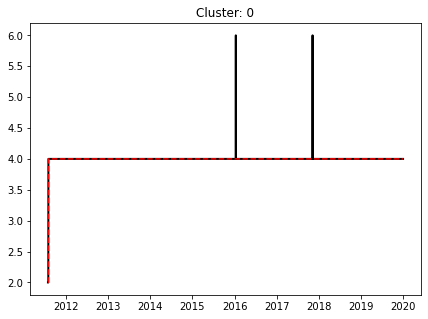

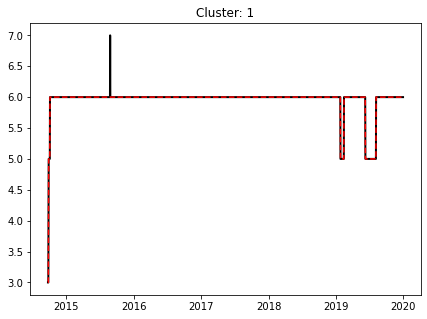

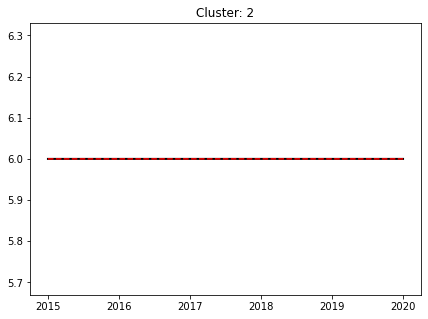

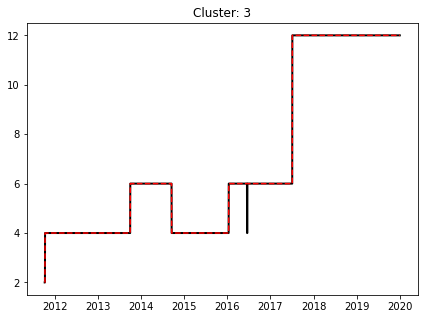

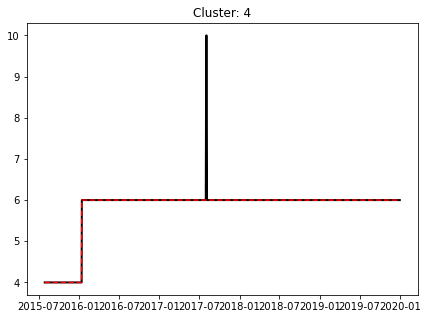

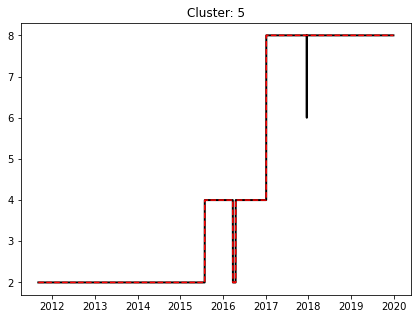

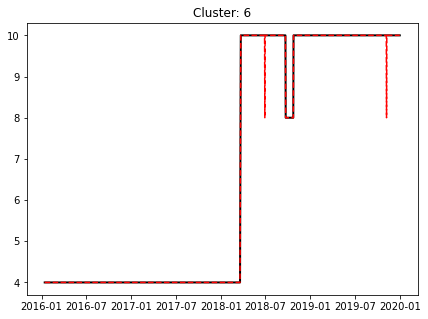

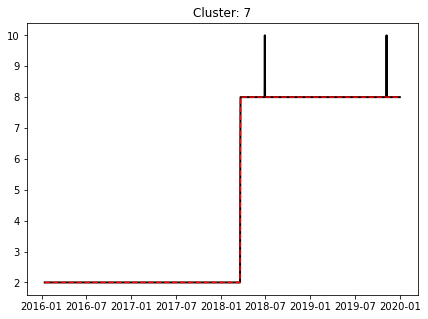

In [62]:
plt.rcParams['figure.figsize'] = [7, 5]
for l in range(len(df['Label'].unique())): 
    plt.plot(plugdf[plugdf['Label'] == l].index, plugdf[plugdf['Label'] == l]['Plugs'], lw=2, color = 'black')
    plt.plot(p2[p2['Label'] == l].index, p2[p2['Label'] == l]['Plugs'], '--', color = 'red')

    plt.title(f"Cluster: {l}")
    plt.show()

Nice! 

In [63]:
p2

,Label,Plugs
2011-07-29,0,2.0
2011-07-30,0,2.0
2011-07-31,0,2.0
2011-08-01,0,2.0
2011-08-02,0,4.0
...,...,...
2019-12-27,7,8.0
2019-12-28,7,8.0
2019-12-29,7,8.0
2019-12-30,7,8.0


In [64]:
tt = df1x.reset_index()
#p2 = plugdf.copy()
uu = p2.reset_index().rename(columns = {'index': 'Date'})
uu

,Date,Label,Plugs
0,2011-07-29,0,2.0
1,2011-07-30,0,2.0
2,2011-07-31,0,2.0
3,2011-08-01,0,2.0
4,2011-08-02,0,4.0
...,...,...,...
17384,2019-12-27,7,8.0
17385,2019-12-28,7,8.0
17386,2019-12-29,7,8.0
17387,2019-12-30,7,8.0


In [65]:
df1x['Label'].unique()

array([0, 1, 2, 5, 6, 4, 7, 3], dtype=int64)

In [66]:
vv = pd.merge(tt,uu, how='left', left_on=['Date', 'Label'], right_on=['Date', 'Label'])

In [67]:
vv['Label'].unique()

array([0, 1, 2, 5, 6, 4, 7, 3], dtype=int64)

In [68]:
vv.isna().sum()

Date                                 0
Label                                0
Charging Time (mins)                 0
Parking Time (mins)                  0
Energy (kWh)                         0
Fee (USD)                            0
# Professional & Other Places        0
# Food                               0
# Shop & Service                     0
# Travel & Transport              3078
# Outdoors & Recreation              0
# Arts & Entertainment               0
# Nightlife Spot                  6156
# Residence                       3078
# College & University            3078
# Event                          12312
Plugs                             7235
dtype: int64

In [69]:
len(df1x)

24624

In [70]:
len(vv)

24624

In [71]:
vv[(vv['Plugs'].isna()) & (vv['Energy (kWh)'] != 0)]

,Date,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Professional & Other Places,# Food,# Shop & Service,# Travel & Transport,# Outdoors & Recreation,# Arts & Entertainment,# Nightlife Spot,# Residence,# College & University,# Event,Plugs


In [72]:
ww = vv.copy()
ww['Plugs'][(ww['Plugs'].isna()) & (ww['Energy (kWh)'] == 0)] = 0

In [73]:
ww = ww.set_index('Date')

In [74]:
np.linspace(0,0.5,7)

array([0.        , 0.08333333, 0.16666667, 0.25      , 0.33333333,
       0.41666667, 0.5       ])

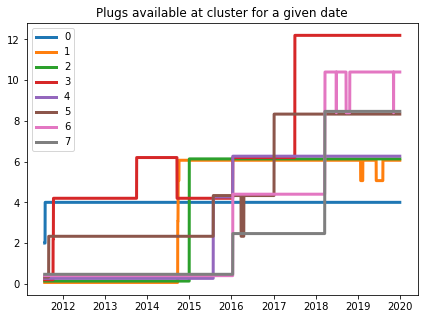

In [75]:
plt.rcParams['figure.facecolor'] = 'white'
fig, ax = plt.subplots()
for l in range(len(vv['Label'].unique())): 
    ax.plot(ww[ww['Label']==l].index, ww[ww['Label']==l]['Plugs']+l/15, lw = 3, label = l)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.legend()
plt.title('Plugs available at cluster for a given date')
plt.show()

In [76]:
ww[ww['Fee (USD)'] != 0].index.min()

Timestamp('2017-08-01 00:00:00')

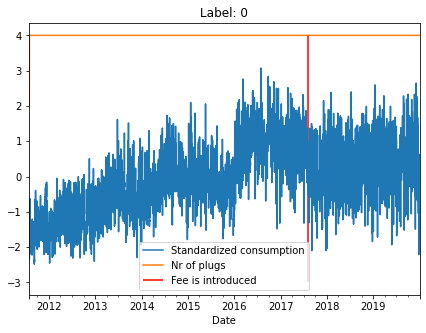

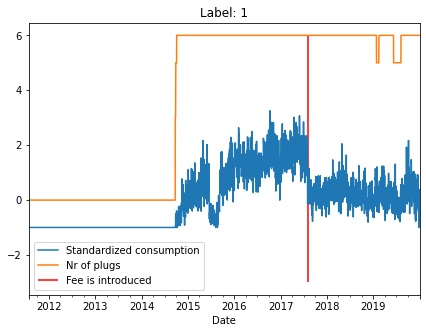

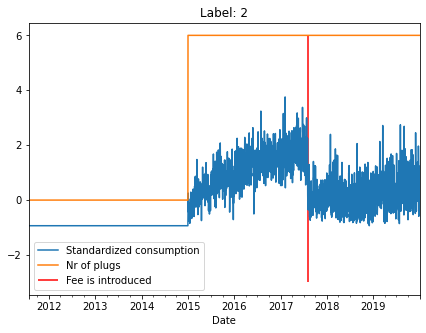

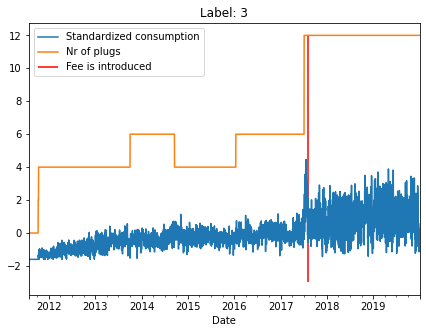

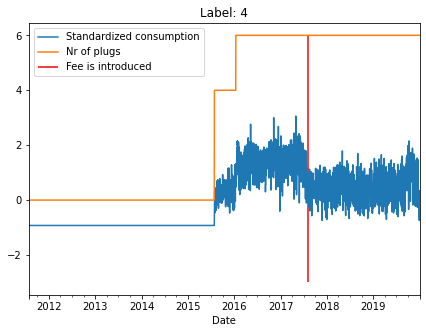

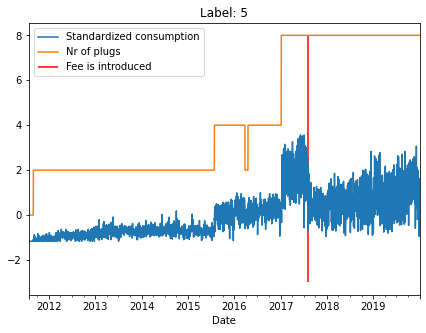

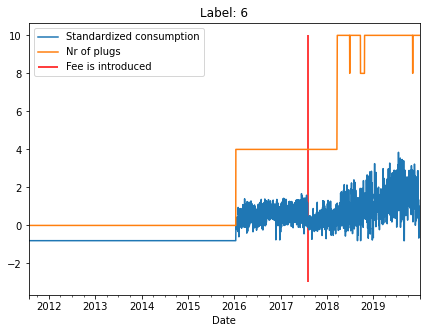

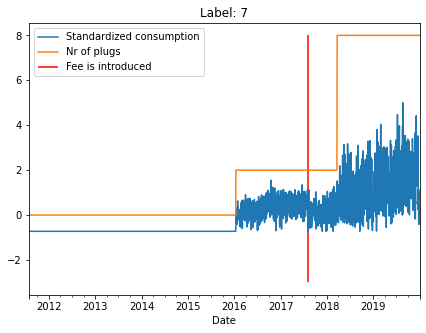

In [77]:
#plt.plot[ww[ww['Label'] == 0]['Energy (kWh)']]
#plt.show()
#la = 5

for la in range(len(vv['Label'].unique())):

    ((ww[ww['Label'] == la]['Energy (kWh)'] - ww[ww['Label'] == la]['Energy (kWh)'].mean())/ ww[ww['Label'] == la]['Energy (kWh)'].std()).plot(label = "Standardized consumption")
    (ww[ww['Label'] == la]['Plugs']).plot(label = "Nr of plugs")
    plt.vlines(ww[ww['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = ww[ww['Label'] == la]['Plugs'].max(), color = 'red', label="Fee is introduced")
    plt.title(f"Label: {la}")
    plt.legend()
    plt.show()

#### Theory on: 
label 0: They shift to more powerful chargers. That why there's a fluke in the nr of ports that then goes down to 4 with an increase in demand as consequence. 

Label 1: It's out of order for a while before they change it. 

Label 3: They install new chargers simultaneously as they start to take a fee. 

Label 4: Change to more powerful charger (spike 1) leads to the demand coming back. However, what made it fall? 

### One-hot encode date

In [78]:
def OneHotEncode(df):
    cluster_dummy = pd.get_dummies(df.Label, prefix="Label")
    day_month_dummy = pd.get_dummies(df.index.day, prefix="Month_Day")
    day_week_dummy = pd.get_dummies(df.index.dayofweek, prefix="Week_Day")
    month_year_dummy = pd.get_dummies(df.index.month, prefix="Year_Month")
    #Setting date as index 
    day_month_dummy = day_month_dummy.set_index(ww.index)
    day_week_dummy = day_week_dummy.set_index(ww.index)
    month_year_dummy = month_year_dummy.set_index(ww.index)
    
    res = pd.concat([cluster_dummy,day_month_dummy,day_week_dummy,month_year_dummy], axis=1)
    df = pd.concat([df, res], axis=1)
    return df

In [79]:
xx = OneHotEncode(ww)

### Holidays 
Very inspired by: https://python.plainenglish.io/a-holiday-date-with-pandas-ef089f83a24

In [177]:
def days_prev_holiday(date, holidays):
    difference=[]
    for item in holidays:
        difference.append(int(str((item-date).days)))
    return abs(max([x for x in difference if x<=0]))


In [173]:
def days_next_holiday(date, holidays):
    difference=[]
    for item in holidays:
        difference.append(int(str((item-date).days)))
    return min([x for x in difference if x>=0])

In [107]:
#xx.index[1]

In [108]:
#cal = calendar()
#holidays = cal.holidays(start=xx.index.min(), end=xx.index.max())
#difference = []
#for item in holidays:
#        difference.append(int(str((item-xx.index[1]).days)))
#min([x for x in difference if x>=0])

In [178]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
       
def Holidays(df):
    cal = calendar()
    holidays = cal.holidays(start=df.index.min() - dt.timedelta(days = 365), end=df.index.max() + dt.timedelta(days = 365))
    df['Holiday'] = df.index.isin(holidays).astype(int)
    
    df = df.reset_index()
    
    df['Days_previous_holiday']= df.apply(lambda row: days_prev_holiday(row['Date'], holidays), axis=1)
    df['Days_next_holiday']= df.apply(lambda row: days_next_holiday(row['Date'], holidays), axis=1)
    
    df = df.set_index('Date')
    return df

In [179]:
xxhol = Holidays(xx)

In [342]:
Holidays(ww)

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Professional & Other Places,# Food,# Shop & Service,# Travel & Transport,# Outdoors & Recreation,# Arts & Entertainment,# Nightlife Spot,# Residence,# College & University,# Event,Plugs,Holiday,days_previous_holiday,days_next_holiday
Date,,,,,,,,,,,,,,,,,,,
2011-07-29,0,114.050000,183.533333,6.249457,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0,2.0,0,25,38
2011-07-30,0,517.200000,686.650000,28.978653,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0,2.0,0,26,37
2011-07-31,0,647.866667,725.983333,37.209163,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0,2.0,0,27,36
2011-08-01,0,95.133333,203.566667,5.041244,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0,2.0,0,28,35
2011-08-02,0,279.983333,280.316667,16.210423,0.000000,284,272,230,218.0,174,129,121.0,60.0,30.0,3.0,4.0,0,29,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,3,1320.766667,1501.966667,100.728000,24.500000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0,12.0,0,2,5
2019-12-28,3,545.383333,620.633333,46.182000,11.000000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0,12.0,0,3,4
2019-12-29,3,755.300000,971.516667,61.271000,15.090000,279,262,237,190.0,150,136,132.0,84.0,26.0,3.0,12.0,0,4,3


In [182]:
xxhol['Energy (kWh)'].corr(xxhol['days_previous_holiday'])

0.02812838558103458

In [184]:
xxhol['Energy (kWh)'].corr(xxhol['days_next_holiday'])

0.04095966142309698

In [185]:
xxhol['Energy (kWh)'].corr(xxhol['Holiday'])

-0.05777973010965212

In [190]:
for la in range(len(xxhol['Label'].unique())):

    ((xxhol[xxhol['Label'] == la]['Energy (kWh)'] - xxhol[xxhol['Label'] == la]['Energy (kWh)'].mean())/ xxhol[xxhol['Label'] == la]['Energy (kWh)'].std()).plot(label = "Standardized consumption")
    ((xxhol[(xxhol['Label'] == la) & ((xxhol['days_previous_holiday'] <= 3) | (xxhol['days_next_holiday'] <= 3))]['Energy (kWh)'] - xxhol(xxhol[(xxhol['Label'] == la) & ((xxhol['days_previous_holiday'] <= 3) | (xxhol['days_next_holiday'] <= 3))]['Energy (kWh)'].mean())/ xxhol(xxhol[(xxhol['Label'] == la) & ((xxhol['days_previous_holiday'] <= 3) | (xxhol['days_next_holiday'] <= 3))]['Energy (kWh)'].std()).plot(label = "Holidays")

    
    #(xxhol[xxhol['Label'] == la]['Plugs']).plot(label = "Nr of plugs")
    #plt.vlines(ww[ww['Fee (USD)'] != 0].index.min(), ymin = -3, ymax = ww[ww['Label'] == la]['Plugs'].max(), color = 'red', label="Fee is introduced")
    plt.title(f"Label: {la}")
    plt.legend()
    plt.show()

SyntaxError: invalid syntax (<ipython-input-190-dd606bd2ed1b>, line 9)

SyntaxError: unexpected EOF while parsing (<ipython-input-189-85056a813039>, line 2)

In [341]:
yy

,Label,Charging Time (mins),Parking Time (mins),Energy (kWh),Fee (USD),# Professional & Other Places,# Food,# Shop & Service,# Travel & Transport,# Outdoors & Recreation,...,Year_Month_3,Year_Month_4,Year_Month_5,Year_Month_6,Year_Month_7,Year_Month_8,Year_Month_9,Year_Month_10,Year_Month_11,Year_Month_12
Date,,,,,,,,,,,,,,,,,,,,,
2011-07-29,0,114.050000,183.533333,6.249457,0.000000,284,272,230,218.0,174,...,0,0,0,0,1,0,0,0,0,0
2011-07-30,0,517.200000,686.650000,28.978653,0.000000,284,272,230,218.0,174,...,0,0,0,0,1,0,0,0,0,0
2011-07-31,0,647.866667,725.983333,37.209163,0.000000,284,272,230,218.0,174,...,0,0,0,0,1,0,0,0,0,0
2011-08-01,0,95.133333,203.566667,5.041244,0.000000,284,272,230,218.0,174,...,0,0,0,0,0,1,0,0,0,0
2011-08-02,0,279.983333,280.316667,16.210423,0.000000,284,272,230,218.0,174,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,3,1320.766667,1501.966667,100.728000,24.500000,279,262,237,190.0,150,...,0,0,0,0,0,0,0,0,0,1
2019-12-28,3,545.383333,620.633333,46.182000,11.000000,279,262,237,190.0,150,...,0,0,0,0,0,0,0,0,0,1
2019-12-29,3,755.300000,971.516667,61.271000,15.090000,279,262,237,190.0,150,...,0,0,0,0,0,0,0,0,0,1


In [97]:
#yy = xx.drop(columns = ['Holiday'])
#yy.to_csv('AlmostClean28042021.csv')

In [422]:
#xx.to_csv('AlmostClean21042021.csv')